# Intersecting GWAS with ML enh/prom:

In [20]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

# System:
import os
import re
import csv
import gzip
import time
import datetime
import sys
import gc
import six.moves.cPickle as pickle
from tqdm import tqdm, tqdm_notebook
from IPython import get_ipython
ipython_shell = get_ipython()

# Math 
import scipy.stats as st
import numpy as np
from scipy.cluster import hierarchy as sch

# Plotting:
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import gridspec, ticker, markers
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from IPython import display
from polo import optimal_leaf_ordering
from scipy import sparse

# Local paths and functions:
import auxfunc_masterlist as AUX
import parse_config

# For random data:
rng = np.random

# For plot points
from scipy.sparse import coo_matrix, csr_matrix
import pandas as pd, numpy as np
from collections import OrderedDict as odict

# Plotting with ds:
import dask.dataframe as dd, datashader as ds
import datashader.transfer_functions as tf

# Style
sns.set(style="ticks", color_codes=True)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


#### Load the data:

In [8]:
# Load in data  and collapse matrix:
datadir = '/home/cboix' + os.environ['DBDIR']
ecpref = datadir + '/observed_aux_18_on_mixed_impobs_QCUT_ENH_bin_on_mixed_impobs_r200_e0_allchr_merged'
pcpref = datadir + '/observed_aux_18_on_mixed_impobs_QCUT_PROM_bin_on_mixed_impobs_r200_e0_allchr_merged'
hpref = datadir + '/H3K27ac_all_bin_on_mixed_impobs_r25_e100_allchr_merged'

def get_data(pref):
    with gzip.open(pref + "_csr.cp.gz", 'rb') as f:
        X = pickle.load(f, encoding='latin1')
    return(X)

def get_names(pref):
    with gzip.open(pref + "_attr.cp.gz", 'rb') as f:
        attr = pickle.load(f, encoding='latin1')
    return(attr['names'])

# Load data:
eX = get_data(ecpref)
pX = get_data(pcpref)
hX = get_data(hpref)

# Load all names:
enam = get_names(ecpref)
pnam = get_names(pcpref)
hnam = get_names(hpref)
hnam = [re.sub(".*BSS","BSS", n).split("_")[0] for n in hnam]

In [9]:
# Reorder h matrix to match the other two:
hord = np.array([np.where(np.array(hnam) == n)[0][0] for n in enam])
hXord = hX[:, hord]
# Turn hX into binary matrix, thresholded at 2:
hXthresh = 1 * (hXord > 0)

ehx = eX.multiply(hXthresh)
phx = pX.multiply(hXthresh)
# STATISTICS on % kept dhs:
print(pX.nnz, "to", phx.nnz, "is pct:", round(100 * phx.nnz/ pX.nnz, 2))
print(eX.nnz, "to", ehx.nnz, "is pct:", round(100 * ehx.nnz/ eX.nnz, 2))
 # STATISTICS on % kept histone locations:
print(hXthresh.nnz, "to", phx.nnz, "is pct:", round(100 * phx.nnz/ hXthresh.nnz, 2))
print(hXthresh.nnz, "to", ehx.nnz, "is pct:", round(100 * ehx.nnz/ hXthresh.nnz, 2))

139406522 to 102558159 is pct: 73.57
207655570 to 118568184 is pct: 57.1
259422930 to 102558159 is pct: 39.53
259422930 to 118568184 is pct: 45.7


In [10]:
# Get enh/promoter indices:
eindpref = datadir + '/ENH_masterlist_indices'
pindpref = datadir + '/PROM_masterlist_indices'
enhind = AUX.load_pickle_gzip(eindpref + "_ind.cp.gz")
promind = AUX.load_pickle_gzip(pindpref + "_ind.cp.gz")

## GWAS Matrix:

In [14]:
gwfile = datadir + '/all_intersect.t1e2.tsv.gz'
mapfile = datadir + '/DHS_Index_WM201902/masterlist_DHSs_733samples_WM20180608_all_coords_hg19_r200_e0_names.core.srt.tsv'
#mlfile = datadir + '/DHS_Index_WM201902/masterlist_DHSs_733samples_WM20180608_all_coords_hg19.core.srt.txt'

# Read files in:
gwdf = pd.read_csv(gwfile, sep="\t", header=None, names=['gwas','chunk','pval'])
mapdf = pd.read_csv(mapfile, sep="\t")
# mldf = pd.read_csv(mlfile, sep="\t", header=None, names=['chr','start','end','chunk'])

In [18]:
gwdf.head()

,gwas,chunk,pval
0,cancer_gwas/breast-all,chunk0004_138_1,0.00798
1,cancer_gwas/breast-all,chunk0004_139_1,0.00798
2,cancer_gwas/breast-all,chunk0004_1677_1,0.00468
3,cancer_gwas/breast-all,chunk0004_2458_1,0.00861
4,cancer_gwas/breast-all,chunk0004_2950_1,0.00399


In [19]:
mapdf.head()

,chr,cls,name
0,chr1,1,chunk0001_10_1
1,chr1,2,chunk0001_11_1
2,chr1,3,chunk0001_12_1
3,chr1,4,chunk0001_13_1
4,chr1,5,chunk0001_14_1


In [16]:
mapdf.shape

(3568912, 3)

In [32]:
# Get the kept chunks and their cluster assignments
mlsub = mldf.loc[obj.xloc,:]
mlsub['assign'] = obj.assign
mlsub = mlsub.drop(['chr','start','end'], axis=1)
mlsub.head()

,chunk,assign
56,chunk0003_29_4,97
57,chunk0003_30_1,97
58,chunk0004_1_1,97
59,chunk0004_2_1,97
60,chunk0004_3_1,100


In [33]:
mergedf = gwdf.merge(mlsub, left_on='chunk', right_on='chunk')
print(mergedf.shape,'from', gwdf.shape)
mergedf.head()

(24251632, 4) from (31713933, 3)


,gwas,chunk,pval,assign
0,cancer_gwas/breast-all,chunk0004_1677_1,0.004680,243
1,cancer_gwas/breast-erpos,chunk0004_1677_1,0.002520,243
2,neuro_gwas/ssgac_cog,chunk0004_1677_1,0.003940,243
3,ukb2/been_in_serious_accident_believed_to_be_l...,chunk0004_1677_1,0.004125,243
4,ukb2/fluid_intelligence_testfluid_intelligence...,chunk0004_1677_1,0.007099,243


In [34]:
mapdf = pd.DataFrame(odict([('assign', obj.bymean), ('ord', np.arange(len(obj.bymean)))]))

In [35]:
outdf = mergedf.merge(mapdf, left_on='assign', right_on='assign')
msrtdf = outdf.sort_values(by=['ord', 'chunk'])

In [36]:
msrtdf.head()

,gwas,chunk,pval,assign,ord
23727375,ukb2/age_last_used_hormonereplacement_therapy_hrt,chunk0004_2791_2,0.008100,43,0
23727376,ukb2/age_started_hormonereplacement_therapy_hrt,chunk0004_2791_2,0.000439,43,0
23727377,ukb2/duration_of_light_diy,chunk0004_2791_2,0.001545,43,0
23727378,ukb2/educational_attainment,chunk0004_2791_2,0.008450,43,0
23727379,ukb2/fathers_age_at_death,chunk0004_2791_2,0.008183,43,0


In [37]:
lb, lvs = msrtdf.chunk.factorize()
glb, glvs = msrtdf.gwas.factorize()

inddf = pd.DataFrame(odict([('g', glb), ('c', lb), ('val', msrtdf.pval), ('ord', msrtdf.ord)]))
inddf.head()

,g,c,val,ord
23727375,0,0,0.008100,0
23727376,1,0,0.000439,0
23727377,2,0,0.001545,0
23727378,3,0,0.008450,0
23727379,4,0,0.008183,0


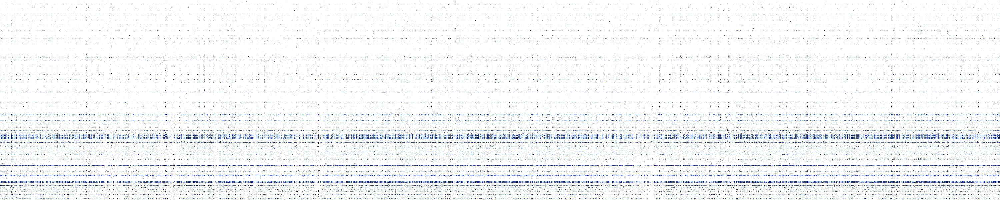

In [38]:
# Yaxt gwas
THRESHOLD = 10e-10
xlim = (0, np.max(inddf.c))
ylim = (0, np.max(inddf.g))
h = 600
canvas = ds.Canvas(x_range=xlim, y_range=ylim, plot_width=5 * h, plot_height=h)

subdf = inddf[inddf.val < THRESHOLD]
agg = canvas.points(subdf, 'c', 'g')
tf.Image(tf.shade(agg))

### Without sorting, by location order:

In [39]:
srtdf = gwdf.sort_values(by=['chunk'])
gwdf = srtdf

In [40]:
lb, lvs = gwdf.chunk.factorize()
glb, glvs = gwdf.gwas.factorize()

inddf = pd.DataFrame(odict([('g', glb), ('c', lb), ('val', gwdf.pval)]))
inddf.head()

,g,c,val
140714,0,0,0.006700
140715,0,1,0.009005
140716,0,2,0.007913
8405514,1,3,0.004870
19776126,2,3,0.004827


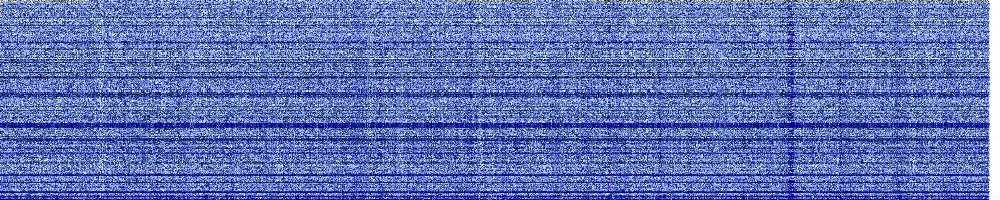

In [41]:
# Yaxt gwas
xlim = (0,np.max(inddf.c))
ylim = (0,np.max(inddf.g))
h = 600
canvas = ds.Canvas(x_range=xlim, y_range=ylim, plot_width=5 * h, plot_height=h)
agg = canvas.points(inddf, 'c', 'g')
tf.Image(tf.shade(agg))

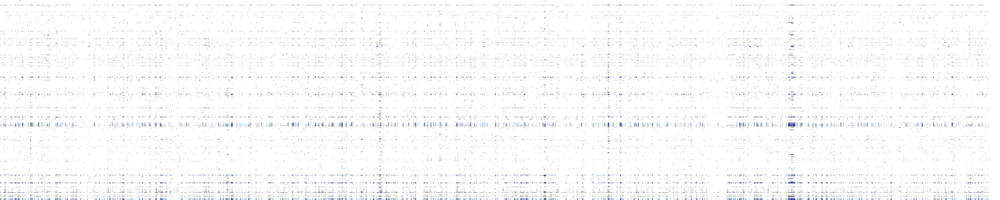

In [42]:
# Yaxt gwas
THRESHOLD = 10e-8
xlim = (0,np.max(inddf.c))
ylim = (0,np.max(inddf.g))
h = 600
canvas = ds.Canvas(x_range=xlim, y_range=ylim, plot_width=5 * h, plot_height=h)

subdf = inddf[inddf.val < THRESHOLD]
agg = canvas.points(subdf, 'c', 'g')
tf.Image(tf.shade(agg))

In [ ]:
# Read in data names and cluster?

### Visualization:
0. Aggregate scores within cluster and plot simple heatmap
1. Cluster GWAS rows - Jaccard @ 10e-8
2. Cluster Locations by K-means/mediods
3. Plot diagonalized clusters


- Normalizing all GWAS to same signal strength?
- Confounders in biobank - prospective study/few people of trait/population structure issues

#### Downstream - preliminary to enrichments
- Cluster matching (bipartite - gwas to the the epigenomes, through high enriched cluster-cluster pairs)
- Cluster-matching at the tree level (clusters that match ~ almost all nodes under certain breakpoint) (in/out of clade - fisher's exact test for the cluster enrichment)

- Potentially - 2 rounds clustering, remove the very strongly constitutive ones in future.


### Plot interactively:

In [ ]:
datashade(hv.Points(sframe, kdims=['y', 'x']), cmap=plt.cm.binary, min_alpha=0).opts(width=2400, height=600)

In [ ]:
# datashade(hv.Points(sframe, kdims=['x', 'y'], vdims=['cat']), aggregator=ds.count_cat('cat')).opts(width=400, height=400)